In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
# from nltk.stem import WordNetLemmatizer
# from nltk.corpus import stopwords
from wordcloud import WordCloud
# from textblob import TextBlob
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, ENGLISH_STOP_WORDS
# from sklearn.decomposition import NMF, TruncatedSVD
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
# import re
from sklearn.decomposition import PCA

In [2]:
df_reviews_raw = pd.read_csv("GameReviewsFinal.csv")
df_stats_raw = pd.read_csv("GameStatsFinal.csv")

/usr/local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3071: DtypeWarning: Columns (2,3,6,7,8,9,10,11,12,13,14,15,16,17,18) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,
/usr/local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3071: DtypeWarning: Columns (0,1,5,6,7,8,10,11,12,13,14,15,16,17,21,22,24,25,26,27) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
df_reviews_raw.shape
df_reviews_raw.head(10)


# First two columns look like indexes so I'll be removing them after
# extracting the appid
# Also, dont think we need recommendation id
# author may be useful but not sure currently so removing it
# leaving the other columns

,Unnamed: 0,Unnamed: 0.1,recommendationid,author,language,review,timestamp_created,timestamp_updated,voted_up,votes_up,votes_funny,weighted_vote_score,comment_count,steam_purchase,received_for_free,written_during_early_access,timestamp_dev_responded,developer_response,appid
0,0.0,1155810_1,56542917,76561197965909487,english,"Unfortunately, at this price point I was expec...",1572942648,1572942648,False,11,2,0.658271,0,True,False,True,1.60828e+09,This! Completely fair review! Santa's Visit la...,1155810
1,1.0,1155810_2,83106481,76561197983047952,english,A cute sandbox experience. Fun for the Holiday...,1608896024,1608896024,True,7,0,0.599486,0,True,False,True,NaN,NaN,1155810
2,2.0,1155810_3,80462795,76561198003402530,english,While its a very short experience it has fanta...,1606426930,1606426930,True,7,0,0.571652,0,True,False,True,NaN,NaN,1155810
3,3.0,1155810_4,60567594,76561198094159267,english,I got Santa trapped in Purgatory.\n10/10 holid...,1577329940,1577329940,True,7,1,0.571652,0,True,False,True,NaN,NaN,1155810
4,4.0,1155810_5,106470307,76561198066590240,english,[h1]Experienced on the Oculus Quest 2[/h1]\n\n...,1640408475,1640408475,True,3,1,0.566025,0,True,False,True,NaN,NaN,1155810
5,5.0,1155810_6,57259115,76561198062396161,english,"Multiple crashes, doesn't like WMR, had to ref...",1573877503,1573877503,False,3,1,0.542957,0,True,False,True,1.57442e+09,"Hello! At the time of this writing, as indica...",1155810
6,6.0,1155810_7,56452383,76561197970431718,english,I'm a kid again playing Santa Have the Christ...,1572832099,1572832099,True,9,3,0.520549,0,True,False,True,NaN,NaN,1155810
7,7.0,1145740_1,56441818,76561198052645607,english,Game is a beat the clock game. Very little ani...,1572819777,1572819777,False,8,0,0.548528,0,True,False,True,NaN,NaN,1145740
8,8.0,1145740_2,76832294,76561198018222615,english,Game is broken and no fixes since 2019. DONT BUY,1601501799,1601501799,False,3,0,0.545455,0,True,False,True,NaN,NaN,1145740
9,9.0,1145740_3,84911987,76561198075822106,english,Developer quit developing this after 1 patch. ...,1610978667,1610978667,False,3,0,0.542039,0,True,False,True,NaN,NaN,1145740


In [4]:
df_reviews_raw[['appid', 'rev_id']] = df_reviews_raw['Unnamed: 0.1'].str.split("_", expand=True)
df_reviews_raw.head()

,Unnamed: 0,Unnamed: 0.1,recommendationid,author,language,review,timestamp_created,timestamp_updated,voted_up,votes_up,votes_funny,weighted_vote_score,comment_count,steam_purchase,received_for_free,written_during_early_access,timestamp_dev_responded,developer_response,appid,rev_id
0,0.0,1155810_1,56542917,76561197965909487,english,"Unfortunately, at this price point I was expec...",1572942648,1572942648,False,11,2,0.658271,0,True,False,True,1.60828e+09,This! Completely fair review! Santa's Visit la...,1155810,1
1,1.0,1155810_2,83106481,76561197983047952,english,A cute sandbox experience. Fun for the Holiday...,1608896024,1608896024,True,7,0,0.599486,0,True,False,True,NaN,NaN,1155810,2
2,2.0,1155810_3,80462795,76561198003402530,english,While its a very short experience it has fanta...,1606426930,1606426930,True,7,0,0.571652,0,True,False,True,NaN,NaN,1155810,3
3,3.0,1155810_4,60567594,76561198094159267,english,I got Santa trapped in Purgatory.\n10/10 holid...,1577329940,1577329940,True,7,1,0.571652,0,True,False,True,NaN,NaN,1155810,4
4,4.0,1155810_5,106470307,76561198066590240,english,[h1]Experienced on the Oculus Quest 2[/h1]\n\n...,1640408475,1640408475,True,3,1,0.566025,0,True,False,True,NaN,NaN,1155810,5


In [5]:
df_reviews_clean = df_reviews_raw.drop(['Unnamed: 0', 'Unnamed: 0.1', 'recommendationid', 'author', 'rev_id'], axis=1)
df_reviews_clean.head()

,language,review,timestamp_created,timestamp_updated,voted_up,votes_up,votes_funny,weighted_vote_score,comment_count,steam_purchase,received_for_free,written_during_early_access,timestamp_dev_responded,developer_response,appid
0,english,"Unfortunately, at this price point I was expec...",1572942648,1572942648,False,11,2,0.658271,0,True,False,True,1.60828e+09,This! Completely fair review! Santa's Visit la...,1155810
1,english,A cute sandbox experience. Fun for the Holiday...,1608896024,1608896024,True,7,0,0.599486,0,True,False,True,NaN,NaN,1155810
2,english,While its a very short experience it has fanta...,1606426930,1606426930,True,7,0,0.571652,0,True,False,True,NaN,NaN,1155810
3,english,I got Santa trapped in Purgatory.\n10/10 holid...,1577329940,1577329940,True,7,1,0.571652,0,True,False,True,NaN,NaN,1155810
4,english,[h1]Experienced on the Oculus Quest 2[/h1]\n\n...,1640408475,1640408475,True,3,1,0.566025,0,True,False,True,NaN,NaN,1155810


In [6]:
df_reviews_clean.isna().sum()

language                            0
review                            140
timestamp_created                   0
timestamp_updated                   0
voted_up                            0
votes_up                            0
votes_funny                         0
weighted_vote_score                 0
comment_count                       0
steam_purchase                      0
received_for_free                   0
written_during_early_access         0
timestamp_dev_responded         39351
developer_response             292175
appid                               0
dtype: int64

In [7]:
# check for missing reviews and removing them

subset = ['review', 'appid']
df_reviews_clean.dropna(subset=subset, axis=0, inplace=True)

In [8]:
# Converting the review column to string
df_reviews_clean['review'] = df_reviews_clean['review'].astype('str')
df_reviews_clean['language'] = df_reviews_clean['language'].astype('str')

In [9]:
df_reviews_clean.info()
df_reviews_clean.head()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 302453 entries, 0 to 302592
Data columns (total 15 columns):
 #   Column                       Non-Null Count   Dtype 
---  ------                       --------------   ----- 
 0   language                     302453 non-null  object
 1   review                       302453 non-null  object
 2   timestamp_created            302453 non-null  object
 3   timestamp_updated            302453 non-null  object
 4   voted_up                     302453 non-null  object
 5   votes_up                     302453 non-null  object
 6   votes_funny                  302453 non-null  object
 7   weighted_vote_score          302453 non-null  object
 8   comment_count                302453 non-null  object
 9   steam_purchase               302453 non-null  object
 10  received_for_free            302453 non-null  object
 11  written_during_early_access  302453 non-null  object
 12  timestamp_dev_responded      263125 non-null  object
 13  developer_resp

,language,review,timestamp_created,timestamp_updated,voted_up,votes_up,votes_funny,weighted_vote_score,comment_count,steam_purchase,received_for_free,written_during_early_access,timestamp_dev_responded,developer_response,appid
0,english,"Unfortunately, at this price point I was expec...",1572942648,1572942648,False,11,2,0.658271,0,True,False,True,1.60828e+09,This! Completely fair review! Santa's Visit la...,1155810
1,english,A cute sandbox experience. Fun for the Holiday...,1608896024,1608896024,True,7,0,0.599486,0,True,False,True,NaN,NaN,1155810
2,english,While its a very short experience it has fanta...,1606426930,1606426930,True,7,0,0.571652,0,True,False,True,NaN,NaN,1155810
3,english,I got Santa trapped in Purgatory.\n10/10 holid...,1577329940,1577329940,True,7,1,0.571652,0,True,False,True,NaN,NaN,1155810
4,english,[h1]Experienced on the Oculus Quest 2[/h1]\n\n...,1640408475,1640408475,True,3,1,0.566025,0,True,False,True,NaN,NaN,1155810


In [10]:
df_stats_raw.head(10)

,Unnamed: 0,Unnamed: 0.1,appid,name,developer,publisher,score_rank,positive,negative,userscore,...,ccu,languages,genre,tags,num_reviews,review_score,review_score_desc,total_positive,total_negative,total_reviews
0,0,0,250340,Blockland,"Eric Hartman, Ben Garney, Anthony Rotondo",Step 1 Games LLC,NaN,4042,1499,0,...,46,English,"Action, Indie, Simulation","Sandbox, Building, Multiplayer, LEGO, Open Wor...",4,6,Mostly Positive,1678,676,2354
1,1,1,429570,The Walking Dead: Michonne - A Telltale Minise...,Telltale Games,Skybound Games,NaN,4754,1292,0,...,9,"English, French, German, Spanish - Spain, Port...",Adventure,"Adventure, Zombies, Story Rich, Choices Matter...",1,6,Mostly Positive,1407,467,1874
2,2,2,775500,SCARLET NEXUS,BANDAI NAMCO Studios Inc.,BANDAI NAMCO Entertainment,NaN,8666,1523,0,...,367,"English, French, Italian, German, Spanish - Sp...","Action, Adventure, RPG","Action, Anime, RPG, Adventure, Action RPG, JRP...",20,8,Very Positive,2892,346,3238
3,3,3,272470,The Incredible Adventures of Van Helsing II,NeocoreGames,NeocoreGames,NaN,1581,725,0,...,7,"English, French, Italian, German, Spanish - Sp...","Action, Adventure, Indie, RPG","RPG, Action, Adventure, Hack and Slash, Action...",20,5,Mixed,479,237,716
4,4,4,222750,Wargame: Airland Battle,Eugen Systems,Eugen Systems,NaN,3670,505,0,...,47,"English, German, French, Italian, Spanish - Sp...","Indie, Simulation, Strategy","Strategy, RTS, Military, Cold War, Wargame, Re...",1,8,Very Positive,1921,276,2197
5,5,5,1285670,Post Void,YCJY Games,YCJY Games,NaN,6474,145,0,...,23,English,"Action, Indie","FPS, Psychedelic, Action Roguelike, Fast-Paced...",20,9,Overwhelmingly Positive,4648,84,4732
6,6,6,547680,Guild Quest,Hyper Hippo Games,Hyper Hippo Games,NaN,1151,556,0,...,13,English,"Casual, Free to Play, Indie, RPG, Simulation, ...","Free to Play, Strategy, Casual, Simulation, Ea...",20,6,Mostly Positive,159,53,212
7,7,7,438030,Dead6hot,Chuck Productions,New Reality Games,NaN,212,259,0,...,39,English,"Action, Casual","Action, Casual, 2D, Pixel Graphics, Indie",20,4,Mostly Negative,35,70,105
8,8,8,1238060,Dead Space 3,Visceral Games,Electronic Arts,NaN,5889,1774,0,...,299,"English, French, Italian, German, Spanish - Sp...",Action,"Action, Horror, Online Co-Op, Sci-fi, Shooter,...",12,6,Mostly Positive,1722,604,2326
9,9,9,1140620,CosmicBreak Universal,"CyberStep, Inc.","CyberStep, Inc.",NaN,644,453,0,...,152,"English, Japanese, Traditional Chinese","Action, Free to Play, Massively Multiplayer, RPG","Free to Play, Action, Massively Multiplayer, R...",0,0,No user reviews,0,0,0


In [11]:
# Merging reviews dataframe and stats dataframe on appid

df_reviews_clean = df_reviews_clean.merge(df_stats_raw, on='appid')
print(df_reviews_clean.head())
df_reviews_clean.info()

  language                                             review  \
0  english  [h1]Buy and play this BEFORE Soko Loco Deluxe....   
1  english  [h1]Buy and play this BEFORE Soko Loco Deluxe....   
2  english  I ran into a bug where a house construction ne...   
3  english  I ran into a bug where a house construction ne...   
4  english  A sweet little tycoon / transport game!\nSuper...   

  timestamp_created timestamp_updated voted_up votes_up votes_funny  \
0        1580149960        1580149975     True        4           0   
1        1580149960        1580149975     True        4           0   
2        1609053807        1609053807    False        1           1   
3        1609053807        1609053807    False        1           1   
4        1652991517        1652991517     True        0           0   

  weighted_vote_score comment_count steam_purchase  ... ccu languages  \
0            0.549797             0           True  ...   0   English   
1            0.549797             0 

In [12]:
# Let us keep only the columns that'd be useful for us

my_reviews = df_reviews_clean[['appid', 'genre', 'tags', 'review']]
my_reviews.head()

,appid,genre,tags,review
0,1135200,"Indie, Simulation, Strategy","Strategy, Indie, Simulation, Trains, Transport...",[h1]Buy and play this BEFORE Soko Loco Deluxe....
1,1135200,"Indie, Simulation, Strategy","Strategy, Indie, Simulation, Trains, Transport...",[h1]Buy and play this BEFORE Soko Loco Deluxe....
2,1135200,"Indie, Simulation, Strategy","Strategy, Indie, Simulation, Trains, Transport...",I ran into a bug where a house construction ne...
3,1135200,"Indie, Simulation, Strategy","Strategy, Indie, Simulation, Trains, Transport...",I ran into a bug where a house construction ne...
4,1135200,"Indie, Simulation, Strategy","Strategy, Indie, Simulation, Trains, Transport...",A sweet little tycoon / transport game!\nSuper...


In [13]:
# Seems like there are duplicate values

my_reviews = my_reviews.drop_duplicates(ignore_index=True)
print(my_reviews.head())
my_reviews.info()

     appid                        genre  \
0  1135200  Indie, Simulation, Strategy   
1  1135200  Indie, Simulation, Strategy   
2  1135200  Indie, Simulation, Strategy   
3  1231120      Casual, Indie, Strategy   
4  1231120      Casual, Indie, Strategy   

                                                tags  \
0  Strategy, Indie, Simulation, Trains, Transport...   
1  Strategy, Indie, Simulation, Trains, Transport...   
2  Strategy, Indie, Simulation, Trains, Transport...   
3  Casual, Strategy, Indie, Puzzle, Puzzle-Platfo...   
4  Casual, Strategy, Indie, Puzzle, Puzzle-Platfo...   

                                              review  
0  [h1]Buy and play this BEFORE Soko Loco Deluxe....  
1  I ran into a bug where a house construction ne...  
2  A sweet little tycoon / transport game!\nSuper...  
3  Lovely work! My 6 year old daughter saw me pla...  
4  If you enjoy 2D puzzle platformers, this game ...  
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 246652 entries, 0 to 246

In [14]:
my_reviews['genre'] = my_reviews['genre'].str.split(', ')
my_reviews.head()

,appid,genre,tags,review
0,1135200,"[Indie, Simulation, Strategy]","Strategy, Indie, Simulation, Trains, Transport...",[h1]Buy and play this BEFORE Soko Loco Deluxe....
1,1135200,"[Indie, Simulation, Strategy]","Strategy, Indie, Simulation, Trains, Transport...",I ran into a bug where a house construction ne...
2,1135200,"[Indie, Simulation, Strategy]","Strategy, Indie, Simulation, Trains, Transport...",A sweet little tycoon / transport game!\nSuper...
3,1231120,"[Casual, Indie, Strategy]","Casual, Strategy, Indie, Puzzle, Puzzle-Platfo...",Lovely work! My 6 year old daughter saw me pla...
4,1231120,"[Casual, Indie, Strategy]","Casual, Strategy, Indie, Puzzle, Puzzle-Platfo...","If you enjoy 2D puzzle platformers, this game ..."


In [15]:
genre_expanded = my_reviews['genre'].explode().groupby(level=0).value_counts() \
                .unstack(fill_value=0).reindex(my_reviews.index, fill_value=0)
genre_expanded.head()
# genre_expanded.info()

genre,Accounting,Action,Adventure,Animation & Modeling,Atmospheric,Audio Production,Blood,Casual,Classic,Dark,...,Software Training,Sports,Strategy,Survival,Survival Horror,Utilities,Video Production,Violent,Web Publishing,Zombies
0,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,1,0,0,...,0,0,1,0,0,0,0,0,0,0


In [16]:
df_reviews_all = pd.concat([my_reviews, genre_expanded], axis=1)

In [17]:
df_reviews_all.head()

,appid,genre,tags,review,Accounting,Action,Adventure,Animation & Modeling,Atmospheric,Audio Production,...,Software Training,Sports,Strategy,Survival,Survival Horror,Utilities,Video Production,Violent,Web Publishing,Zombies
0,1135200,"[Indie, Simulation, Strategy]","Strategy, Indie, Simulation, Trains, Transport...",[h1]Buy and play this BEFORE Soko Loco Deluxe....,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
1,1135200,"[Indie, Simulation, Strategy]","Strategy, Indie, Simulation, Trains, Transport...",I ran into a bug where a house construction ne...,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
2,1135200,"[Indie, Simulation, Strategy]","Strategy, Indie, Simulation, Trains, Transport...",A sweet little tycoon / transport game!\nSuper...,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
3,1231120,"[Casual, Indie, Strategy]","Casual, Strategy, Indie, Puzzle, Puzzle-Platfo...",Lovely work! My 6 year old daughter saw me pla...,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
4,1231120,"[Casual, Indie, Strategy]","Casual, Strategy, Indie, Puzzle, Puzzle-Platfo...","If you enjoy 2D puzzle platformers, this game ...",0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0


In [18]:
## Number of reviews for each genre

genre_expanded.sum(axis=0)

genre
Accounting                    8
Action                   104700
Adventure                 94277
Animation & Modeling       1471
Atmospheric                   4
Audio Production            885
Blood                         4
Casual                    87218
Classic                       4
Dark                          4
Demons                        4
Design & Illustration      1971
Difficult                     4
Early Access              21879
Education                   958
Free to Play               6487
Game Development            415
Gore                        143
Horror                        4
Indie                    175278
Massively Multiplayer      6183
Movie                        20
Nudity                      101
Old School                    4
Photo Editing               427
Psychological                 4
Psychological Horror          4
Puzzle                        4
RPG                       42474
Racing                     9235
Sexual Content              110
Si

In [19]:
## Some EDA on the reviews

review_length = df_reviews_all['review'].str.len()
print(review_length.mean())
print(review_length.std())
print(review_length.max())
print(review_length.min())

600.1663801631448
919.9883748361692
8000
1


In [20]:
# Strings with length 1 don't make any sense. Lets check some strings with length less than 10

# First I'll add review_length as a column
df_reviews_all['review_length'] = review_length

# Now lets check the reviews
for i in range(10):
    print(df_reviews_all.loc[df_reviews_all['review_length'] == i].head()['review'])


Series([], Name: review, dtype: object)
190      󠀡
1182     󠀡
1207     k
1353     😳
1407    \n
Name: review, dtype: object
133     No
451     no
1056    :)
1134    no
1209     ;
Name: review, dtype: object
517     Nah
1158    yes
1604    4\5
2531    (Y)
2640    yes
Name: review, dtype: object
42     6/10
335    good
362    2/10
439    tree
594    nice
Name: review, dtype: object
886     sorry
1376    Brick
1778    solid
1927    booba
2207    SUCKS
Name: review, dtype: object
481     boring
892     It Gud
1902    ur mom
2364    noice.
3109    Super!
Name: review, dtype: object
438     tree...
482     just no
750     Love it
948     unique.
1125    idk kev
Name: review, dtype: object
865     Amazing!
1110    very fun
1156    no cards
1220    fun game
1566    Fun game
Name: review, dtype: object
962     good shit
1133    Good game
1357    very nice
1586    good game
1675    Norm game
Name: review, dtype: object


In [21]:
# I think that even comments like "no" and "yes" can be used to gauge sentiments.
# So I'll only remove comments that are just a single character

df_reviews_all.drop(df_reviews_all[df_reviews_all['review_length'] < 2].index, inplace = True)

In [22]:
print(df_reviews_all.shape)
print(df_reviews_all['review_length'].mean())
print(df_reviews_all['review_length'].std())
print(df_reviews_all['review_length'].max())
print(df_reviews_all['review_length'].min())

(246031, 48)
601.6787193483748
920.6554760352408
8000
2


In [23]:
# turning all reviews to lower case

df_reviews_all['review'] = df_reviews_all['review'].str.lower()

In [24]:
my_additional_stop_words = ['game', 'games', 'software', 'really', 'play', 
                            'playing', 'great', 'good', 'fun', 'time', 'make', 
                            'don', 'doesn', 'nt', 'recommend', 'http', 'https', 
                            'lot', 'pretty', 'review', 've', 'worth', 'bad', 'hour']
stop_words = ENGLISH_STOP_WORDS.union(my_additional_stop_words)
my_pattern = r'\b[^\d\W][^\d\W]+\b'

In [25]:
count_vectorizer = CountVectorizer(ngram_range=(1, 2),
                                   max_features=3000,
                                   stop_words=stop_words, 
                                   token_pattern=my_pattern,
                                   max_df = 0.65)

# tried for ngram_range=3 but didn't get anything different

In [26]:
# function for making wordcloud

def make_wordcloud(count_vectorizer, df_col, title):
    count_data = count_vectorizer.fit_transform(df_col)
    for_wordcloud = count_vectorizer.get_feature_names()
    for_wordcloud_str = ' '.join(for_wordcloud)
    
    try:
        wordcloud = WordCloud(width=750, height=350, background_color ='white',
                          colormap='plasma', min_font_size = 7).generate(for_wordcloud_str)
    except:
        print(f"No Wordcloud possible for {df_col}")
        return

    plt.figure(figsize=(17, 12), facecolor=None)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(title, fontdict={"fontsize": 24})
    plt.axis("off")
    plt.tight_layout()

    plt.show()

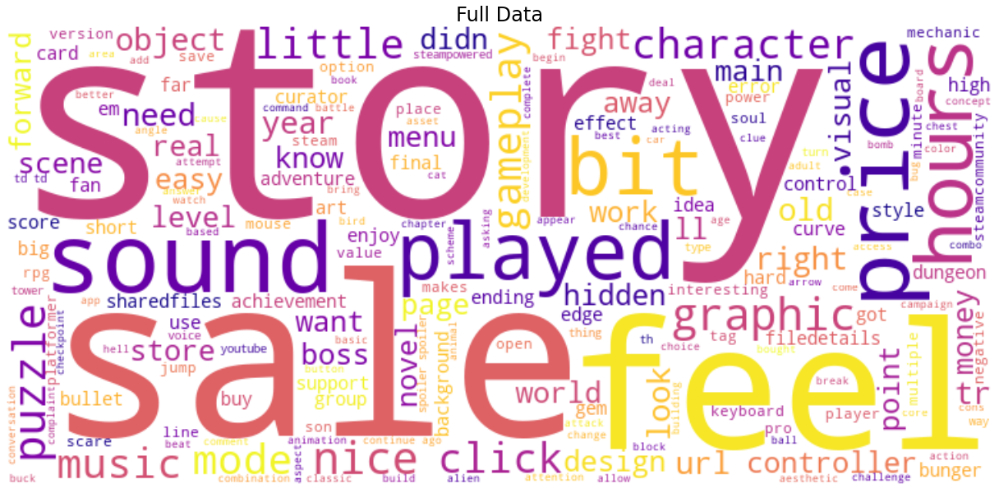

In [27]:
make_wordcloud(count_vectorizer, df_reviews_all['review'], "Full Data")

In [28]:
print(df_reviews_all['review'].str.contains('pretty').sum())

df_pretty = df_reviews_all[['review']][df_reviews_all['review'].str.contains('pretty')]

# print(df_pretty.info)

print("Review 0: ", df_pretty.iloc[0,0], "\n")
print("Review 1: ", df_pretty.iloc[1,0], "\n")
print("Review 3: ", df_pretty.iloc[3,0], "\n")
print("Review 10: ", df_pretty.iloc[10,0], "\n")
print("Review 50: ", df_pretty.iloc[50,0], "\n")

25364
Review 0:  didn't expect much going in, but the game turned out to be pretty decent.
the game is very similar to phasmophobia but varies in some ways.
when the nanobot monster attacks you, it will lower your suits integrity. upon 0, it's next attack will kill you.

using multiple tools, you must find the infection and depending on what tools get a response, you will be given a procedure to destroy it. the procedure is usually 'go to location x, use tool y'

currently once the nanobot monster attacks, i dont think there's a way to avoid it? so you may end up having a teammate with better suit integrity taking a tactical hit.

some downsides. the monster is limited to one model and one type of attack. hopefully they can add more in the future. the attack animation from your pov is pretty decent, but from another players it looks a bit silly. the shadow of the monster as it approaches you is a bit basic as well.
some areas of the map can be blocked by the maps procedural generation.

In [29]:
print(df_reviews_all['review'].str.contains('worth').sum())

df_worth = df_reviews_all[['review']][df_reviews_all['review'].str.contains('worth')]

# print(df_worth.info)

print("Review 0: ", df_worth.iloc[0,0], "\n")
print("Review 1: ", df_worth.iloc[1,0], "\n")
print("Review 3: ", df_worth.iloc[3,0], "\n")
print("Review 10: ", df_worth.iloc[10,0], "\n")
print("Review 50: ", df_worth.iloc[50,0], "\n")

28686
Review 0:  if you enjoy 2d puzzle platformers, this game is worth a shot. 

Review 1:  batsumaru is a really chill little puzzle game based on a new unique mechanic, but is still surprisingly deep. worth trying for people who like visual puzzles!
 

Review 3:  1. you can't be male or female as the game treats you as a genderless brick.

2. the stat increases are inconsistent with the choices. what i mean by that is that you may choose 3 choices to increase one stat and yet if you restart and repeat, those same choices may give you less than the previous play through even tho none of your choices have differed.

3. the whole point of this game is to rent out your (supposedly) ruthless boss lady's property and make enough money to prove your worth, beat your rival and get a promotion. problem is, every time you have a nice chunk of change coming in from tenants, the author throws in some asinine wrench to disrupt your cash counting.

examples: 1. my first tenant was a man and his f

In [30]:
print(df_reviews_all['review'].str.contains('hour$').sum())

df_hour = df_reviews_all[['review']][df_reviews_all['review'].str.contains('hour$', regex=True)]

print("Review 0: ", df_hour.iloc[0,0], "\n")
print("Review 1: ", df_hour.iloc[1,0], "\n")
print("Review 3: ", df_hour.iloc[3,0], "\n")
print("Review 10: ", df_hour.iloc[10,0], "\n")

14
Review 0:  good game. many hour 

Review 1:  very short can finish it in less the half a hour 

Review 3:  its fun, but you reach the end game in maybe an hour 

Review 10:  cute and relaxing platformer. somewhat lacking in substance, but it's a nice way to spend half an hour 



In [31]:
print(df_reviews_all['review'].str.contains('story').sum())

df_story = df_reviews_all[['review']][df_reviews_all['review'].str.contains('story')]

print("Review 0: ", df_story.iloc[0,0], "\n")
print("Review 1: ", df_story.iloc[1,0], "\n")
print("Review 3: ", df_story.iloc[3,0], "\n")
print("Review 10: ", df_story.iloc[10,0], "\n")
print("Review 50: ", df_story.iloc[50,0], "\n")

35437
Review 0:  usually i very much enjoy choice of games, but this onw was honestly a little boring. there was almost no social aspect, and no real relationships. it feels quite short and left me with no strong feelings. this particular story is genuinely just a straigtforward "what would it be like to be a real estate agent who isn't particularily good at anything and has a kind of vreepy house?" there were so many spots i thought so much more would happen, but ended up being a loose end or just not flushed out at all making it feel rushed. my biggest complaint though would probably be lack of control over who my character was. several times throughout i was forced to choose options i would never want to pursue and just left me feeling bad about it. i genuinely don't feel satisfied having spent money on this story. i really wanted to like it. 

Review 1:  1. you can't be male or female as the game treats you as a genderless brick.

2. the stat increases are inconsistent with the cho

In [32]:
df_useful_genre = genre_expanded.drop([col for col, val in genre_expanded.sum(axis=0).iteritems() if val < 100], axis=1)
df_useful_genre.head()

genre,Action,Adventure,Animation & Modeling,Audio Production,Casual,Design & Illustration,Early Access,Education,Free to Play,Game Development,...,Racing,Sexual Content,Simulation,Software Training,Sports,Strategy,Utilities,Video Production,Violent,Web Publishing
0,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,1,0,0,0,0
3,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0
4,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0


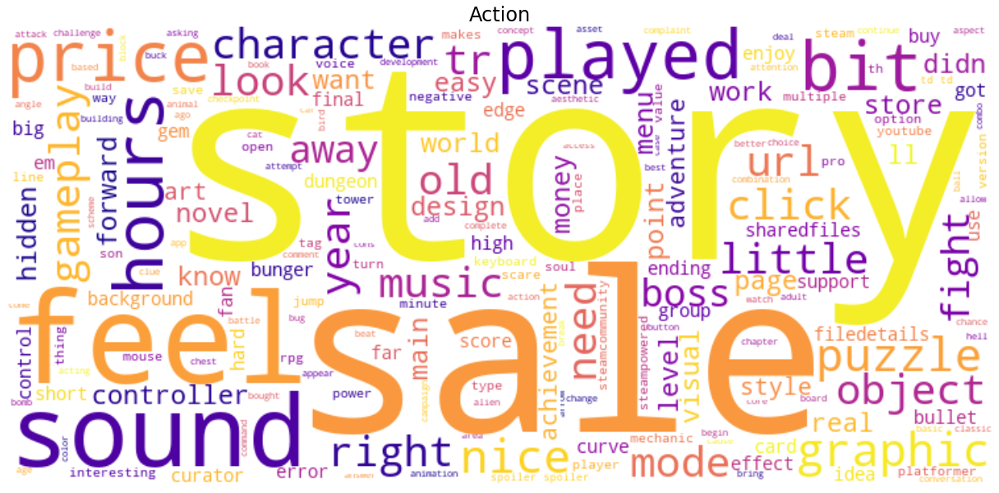

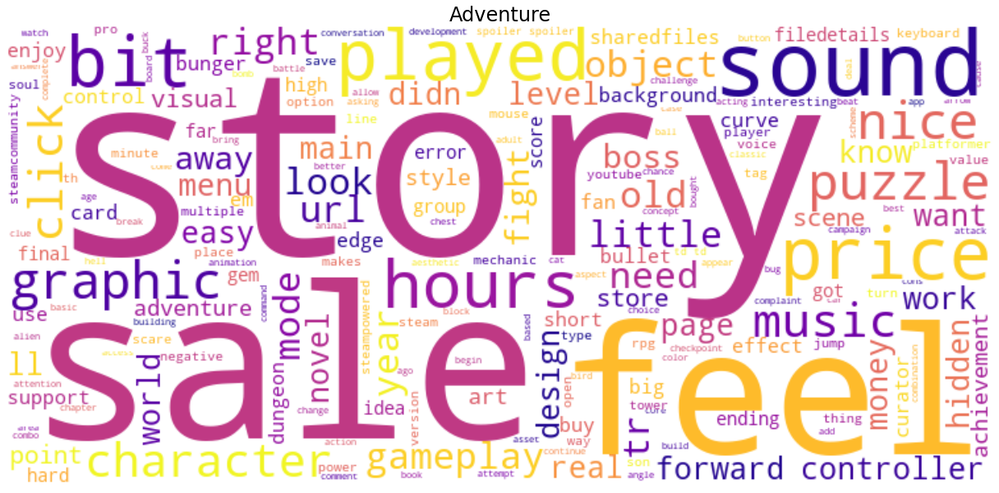

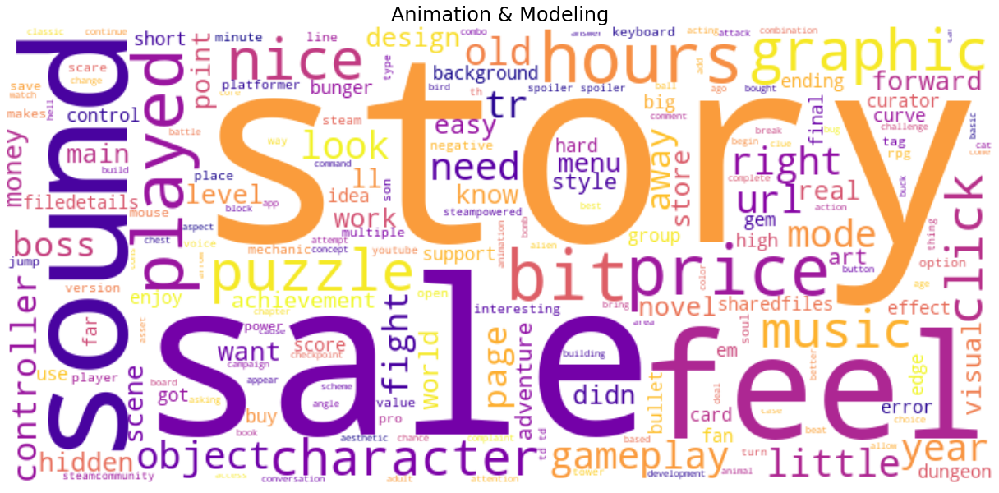

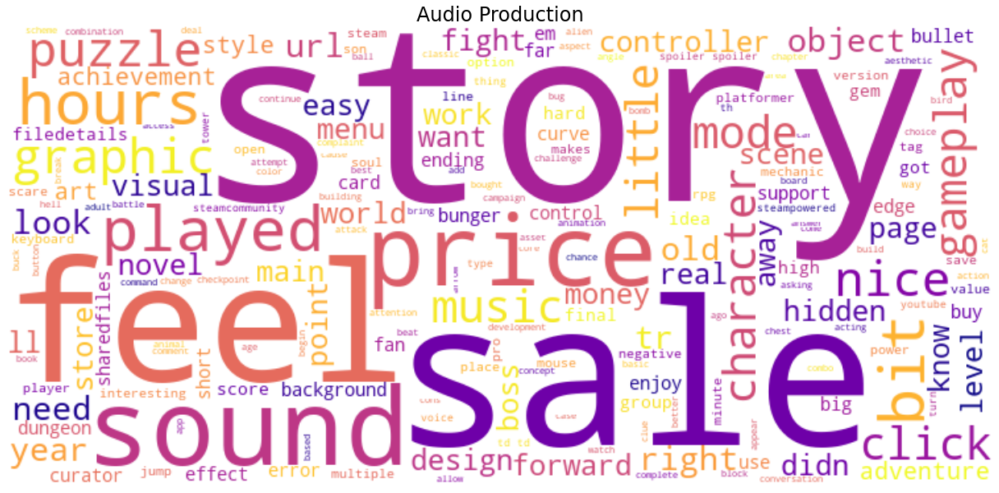

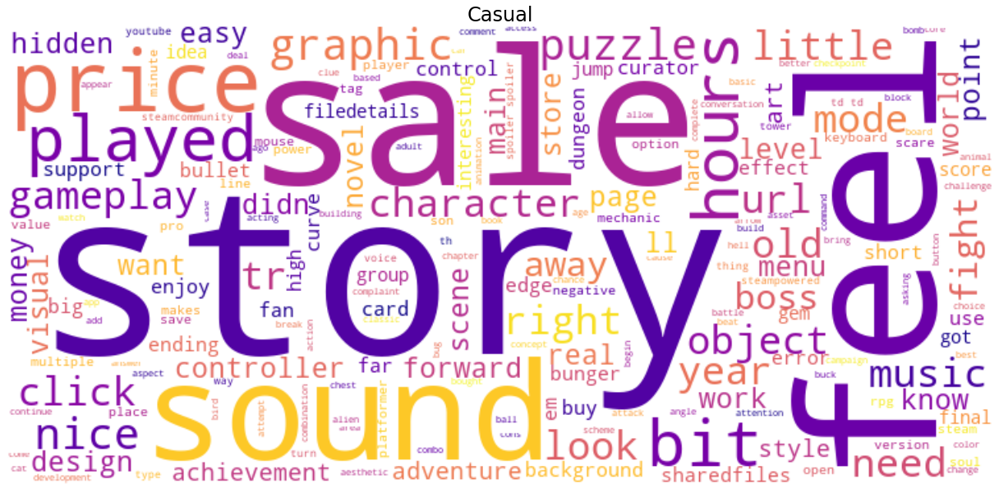

...

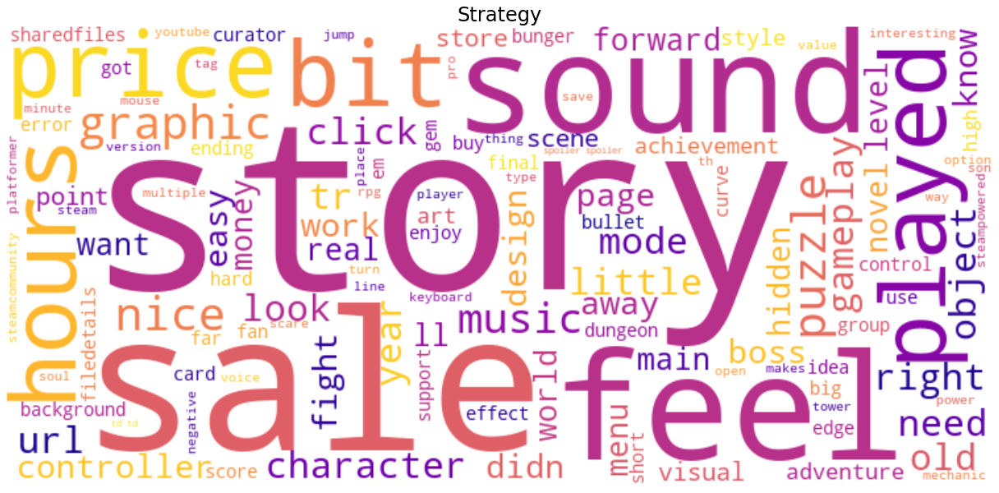

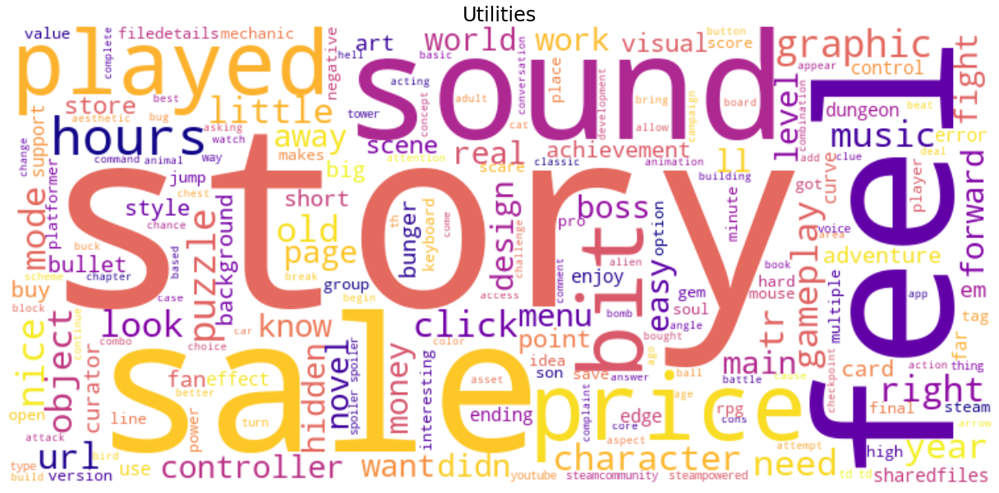

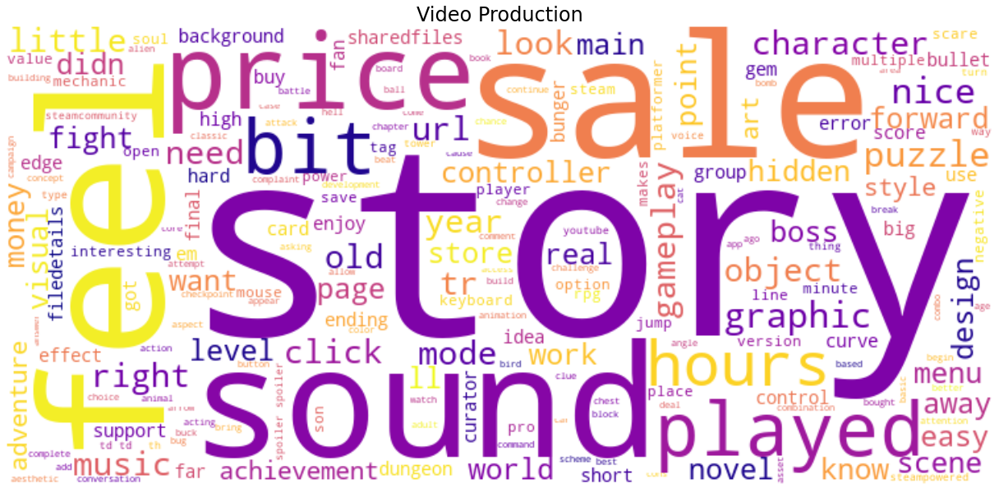

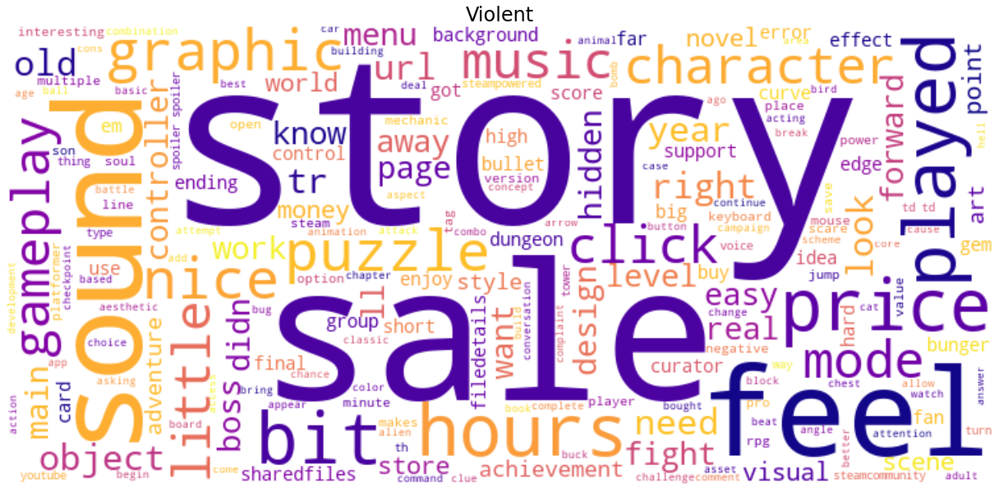

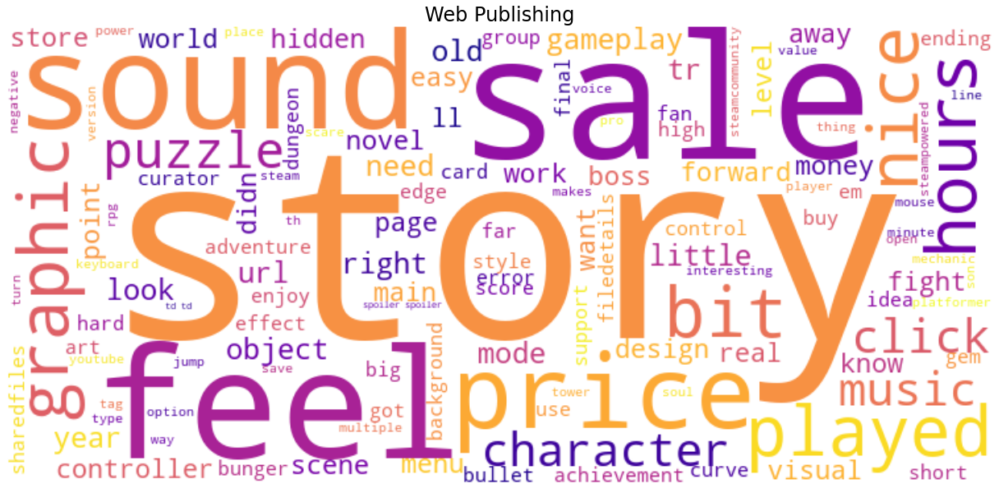

In [33]:
for genre in df_useful_genre.columns:
    # print(genre)
    df_temp = df_reviews_all.loc[df_reviews_all[genre] == 1]
    try:
        make_wordcloud(count_vectorizer, df_reviews_all['review'], genre)
    except:
        print(f"genre {genre} has no vocabulary")

In [47]:
tfidf_vectorizer = TfidfVectorizer(ngram_range=(1, 2),
                                   max_features=3000,
                                   stop_words=stop_words, 
                                   token_pattern=my_pattern,
                                   max_df = 0.65)

X = tfidf_vectorizer.fit_transform(df_reviews_all['review'])

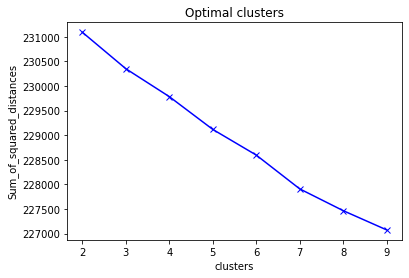

In [49]:
Sum_of_squared_distances = []
clusters = range(2,10)

for k in clusters:
    km = KMeans(n_clusters=k, max_iter=200, n_init=10, random_state=88)
    km = km.fit(X)
    Sum_of_squared_distances.append(km.inertia_)
    
plt.plot(clusters, Sum_of_squared_distances, 'bx-')
plt.xlabel('clusters')
plt.ylabel('Sum_of_squared_distances')
plt.title('Optimal clusters')
plt.show()

In [50]:
# number of optimum clusters seems to be 3 or 5 or 7. I'll go with 3

true_k = 3
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=200, n_init=10, random_state=88)
model.fit(X)
labels=model.labels_

In [51]:
# Performing PCA for visualising

pca = PCA(n_components=2, random_state=88)

pca_vecs = pca.fit_transform(X.toarray())

x0 = pca_vecs[:, 0]
x1 = pca_vecs[:, 1]

In [52]:
# Adding to the original dataframe for further analysis

df_reviews_all['cluster'] = labels
df_reviews_all['x0'] = x0
df_reviews_all['x1'] = x1

df_reviews_all.head()

,appid,genre,tags,review,Accounting,Action,Adventure,Animation & Modeling,Atmospheric,Audio Production,...,Survival Horror,Utilities,Video Production,Violent,Web Publishing,Zombies,review_length,cluster,x0,x1
0,1135200,"[Indie, Simulation, Strategy]","Strategy, Indie, Simulation, Trains, Transport...",[h1]buy and play this before soko loco deluxe....,0,0,0,0,0,0,...,0,0,0,0,0,0,1024,2,0.070638,-0.035778
1,1135200,"[Indie, Simulation, Strategy]","Strategy, Indie, Simulation, Trains, Transport...",i ran into a bug where a house construction ne...,0,0,0,0,0,0,...,0,0,0,0,0,0,118,0,0.019105,-0.035658
2,1135200,"[Indie, Simulation, Strategy]","Strategy, Indie, Simulation, Trains, Transport...",a sweet little tycoon / transport game!\nsuper...,0,0,0,0,0,0,...,0,0,0,0,0,0,64,0,-0.076252,0.010830
3,1231120,"[Casual, Indie, Strategy]","Casual, Strategy, Indie, Puzzle, Puzzle-Platfo...",lovely work! my 6 year old daughter saw me pla...,0,0,0,0,0,0,...,0,0,0,0,0,0,90,0,-0.079572,-0.031101
4,1231120,"[Casual, Indie, Strategy]","Casual, Strategy, Indie, Puzzle, Puzzle-Platfo...","if you enjoy 2d puzzle platformers, this game ...",0,0,0,0,0,0,...,0,0,0,0,0,0,62,0,-0.061897,0.034581


In [53]:
# Function to get the top terms in each cluster

def get_top_keywords(n_terms, X, labels):
    df = pd.DataFrame(X.todense()).groupby(labels).mean() 
    terms = tfidf_vectorizer.get_feature_names()
    for i,r in df.iterrows():
        print('\nCluster {}'.format(i))
        print(','.join([terms[t] for t in np.argsort(r)[-n_terms:]]))
            
get_top_keywords(10, X, labels)


Cluster 0
cool,simple,price,better,little,just,played,best,buy,love

Cluster 1
nice graphics,short,like,story,puzzle,music,graphics,little,nice little,nice

Cluster 2
think,gameplay,bit,feel,little,way,level,story,just,like


In [54]:
df_Cluster0 = df_reviews_all.loc[df_reviews_all['cluster'] == 0]
print("Cluster 0 - Review 0:", df_Cluster0.iloc[0, 3], "\n")
print("Cluster 0 - Review 1:", df_Cluster0.iloc[1, 3], "\n")
print("Cluster 0 - Review 2:", df_Cluster0.iloc[2, 3], "\n")
print("Cluster 0 - Review 3:", df_Cluster0.iloc[3, 3], "\n")
print("Cluster 0 - Review 4:", df_Cluster0.iloc[4, 3], "\n")
print("Cluster 0 - Review 5:", df_Cluster0.iloc[5, 3], "\n")
print("Cluster 0 - Review 6:", df_Cluster0.iloc[6, 3], "\n")
print("Cluster 0 - Review 7:", df_Cluster0.iloc[7, 3], "\n")
print("Cluster 0 - Review 8:", df_Cluster0.iloc[8, 3], "\n")
print("Cluster 0 - Review 9:", df_Cluster0.iloc[9, 3], "\n")

Cluster 0 - Review 0: i ran into a bug where a house construction never ended and i don't like this type of game enough to power through it. 

Cluster 0 - Review 1: a sweet little tycoon / transport game!
super super fun to play! 

Cluster 0 - Review 2: lovely work! my 6 year old daughter saw me playing and kicked me off so she could play it! 

Cluster 0 - Review 3: if you enjoy 2d puzzle platformers, this game is worth a shot. 

Cluster 0 - Review 4: this game gives me headache. the game is very choppy and the quality is bad. i used the oculus quest 2. 

Cluster 0 - Review 5: pleasant and complex, this small game tickles your brain as it challenges you to recognize patterns and optimize your solutions. great value for cost! 

Cluster 0 - Review 6: a very easy-to-learn, but compelling puzzle game that you can lose hours in happily. 

Cluster 0 - Review 7: one of my favorite flash games, on steam? yes please! 

Cluster 0 - Review 8: this game clearly needs work to be playable but it has

In [55]:
df_Cluster1 = df_reviews_all.loc[df_reviews_all['cluster'] == 1]
print("Cluster 1 - Review 0:", df_Cluster1.iloc[0, 3], "\n")
print("Cluster 1 - Review 1:", df_Cluster1.iloc[1, 3], "\n")
print("Cluster 1 - Review 2:", df_Cluster1.iloc[2, 3], "\n")
print("Cluster 1 - Review 3:", df_Cluster1.iloc[3, 3], "\n")
print("Cluster 1 - Review 4:", df_Cluster1.iloc[4, 3], "\n")
print("Cluster 1 - Review 5:", df_Cluster1.iloc[5, 3], "\n")
print("Cluster 1 - Review 6:", df_Cluster1.iloc[6, 3], "\n")
print("Cluster 1 - Review 7:", df_Cluster1.iloc[7, 3], "\n")
print("Cluster 1 - Review 8:", df_Cluster1.iloc[8, 3], "\n")
print("Cluster 1 - Review 9:", df_Cluster1.iloc[9, 3], "\n")

Cluster 1 - Review 0: nice addictive and competitive mini-games, it's good to play for improve your score
it may be good to have a system of success and rewards 

Cluster 1 - Review 1: wish it was easier to obtain this at launch but still a nice benefit to have rather than being locked to the game as a dlc. 

Cluster 1 - Review 2: nice little nostalgia trip with no strings attached. if you want to relive the classic jrpg charm without losing several weeks of your free time, this might be for you. very simple and very short (about 1,5 to 2 hours for a completionist run). 

Cluster 1 - Review 3: a quick fun game with a nice old school flavor. 

Cluster 1 - Review 4: a nice and challenging match three game.  the story line and artifacts you find are pretty pointless, but the game offers plenty of strategy and best of all no money grabs!  buy it once, play it all you want. 

Cluster 1 - Review 5: nice puzzles 

Cluster 1 - Review 6: this game is quite tricky... clicking everywhere gets tir

In [57]:
df_Cluster2 = df_reviews_all.loc[df_reviews_all['cluster'] == 2]
print("Cluster 2 - Review 0:", df_Cluster2.iloc[0, 3], "\n")
print("Cluster 2 - Review 1:", df_Cluster2.iloc[1, 3], "\n")
print("Cluster 2 - Review 2:", df_Cluster2.iloc[2, 3], "\n")
print("Cluster 2 - Review 3:", df_Cluster2.iloc[3, 3], "\n")
print("Cluster 2 - Review 4:", df_Cluster2.iloc[4, 3], "\n")
print("Cluster 2 - Review 5:", df_Cluster2.iloc[5, 3], "\n")
print("Cluster 2 - Review 6:", df_Cluster2.iloc[6, 3], "\n")
print("Cluster 2 - Review 7:", df_Cluster2.iloc[7, 3], "\n")
print("Cluster 2 - Review 8:", df_Cluster2.iloc[8, 3], "\n")
print("Cluster 2 - Review 9:", df_Cluster2.iloc[9, 3], "\n")

Cluster 2 - Review 0: [h1]buy and play this before soko loco deluxe. it's an astonishingly good game for this price point.[/h1]

soko loco falls into a subgenre that i'll call railroad-lites: railway management games that have goal-driven gameplay like railroad tycoon without the massive web of variables that require dozens (if not hundreds) of hours of gameplay to fully appreciate. of the games in its subgenre, it does the best job - even better than its deluxe version - of making you feel as if you are physically picking up and placing individual pieces of railroad track on the terrain.

if you like train games because of how they remind you of playing with wooden train sets in your youth, soko loco is an absolute must-purchase. even if not, i'd argue this game gives you tremendous value for its price-point. if you don't like the ux, you can always refund it and purchase soko loco deluxe - it has several qol improvements that will probably suit you.

for my money, though, i recommend

In [58]:
# df_Cluster3 = df_reviews_all.loc[df_reviews_all['cluster'] == 3]
# print("Cluster 3 - Review 0:", df_Cluster3.iloc[0, 3], "\n")
# print("Cluster 3 - Review 1:", df_Cluster3.iloc[1, 3], "\n")
# print("Cluster 3 - Review 2:", df_Cluster3.iloc[2, 3], "\n")
# print("Cluster 3 - Review 3:", df_Cluster3.iloc[3, 3], "\n")
# print("Cluster 3 - Review 4:", df_Cluster3.iloc[4, 3], "\n")
# print("Cluster 3 - Review 5:", df_Cluster3.iloc[5, 3], "\n")
# print("Cluster 3 - Review 6:", df_Cluster3.iloc[6, 3], "\n")
# print("Cluster 3 - Review 7:", df_Cluster3.iloc[7, 3], "\n")
# print("Cluster 3 - Review 8:", df_Cluster3.iloc[8, 3], "\n")
# print("Cluster 3 - Review 9:", df_Cluster3.iloc[9, 3], "\n")

In [59]:
# df_Cluster4 = df_reviews_all.loc[df_reviews_all['cluster'] == 4]
# print("Cluster 4 - Review 0:", df_Cluster4.iloc[0, 3], "\n")
# print("Cluster 4 - Review 1:", df_Cluster4.iloc[1, 3], "\n")
# print("Cluster 4 - Review 2:", df_Cluster4.iloc[2, 3], "\n")
# print("Cluster 4 - Review 3:", df_Cluster4.iloc[3, 3], "\n")
# print("Cluster 4 - Review 4:", df_Cluster4.iloc[4, 3], "\n")
# print("Cluster 4 - Review 5:", df_Cluster4.iloc[5, 3], "\n")
# print("Cluster 4 - Review 6:", df_Cluster4.iloc[6, 3], "\n")
# print("Cluster 4 - Review 7:", df_Cluster4.iloc[7, 3], "\n")
# print("Cluster 4 - Review 8:", df_Cluster4.iloc[8, 3], "\n")
# print("Cluster 4 - Review 9:", df_Cluster4.iloc[9, 3], "\n")

In [60]:
# df_Cluster5 = df_reviews_all.loc[df_reviews_all['cluster'] == 5]
# print("Cluster 5 - Review 0:", df_Cluster5.iloc[0, 3], "\n")
# print("Cluster 5 - Review 1:", df_Cluster5.iloc[1, 3], "\n")
# print("Cluster 5 - Review 2:", df_Cluster5.iloc[2, 3], "\n")
# print("Cluster 5 - Review 3:", df_Cluster5.iloc[3, 3], "\n")
# print("Cluster 5 - Review 4:", df_Cluster5.iloc[4, 3], "\n")
# print("Cluster 5 - Review 5:", df_Cluster5.iloc[5, 3], "\n")
# print("Cluster 5 - Review 6:", df_Cluster5.iloc[6, 3], "\n")
# print("Cluster 5 - Review 7:", df_Cluster5.iloc[7, 3], "\n")
# print("Cluster 5 - Review 8:", df_Cluster5.iloc[8, 3], "\n")
# print("Cluster 5 - Review 9:", df_Cluster5.iloc[9, 3], "\n")

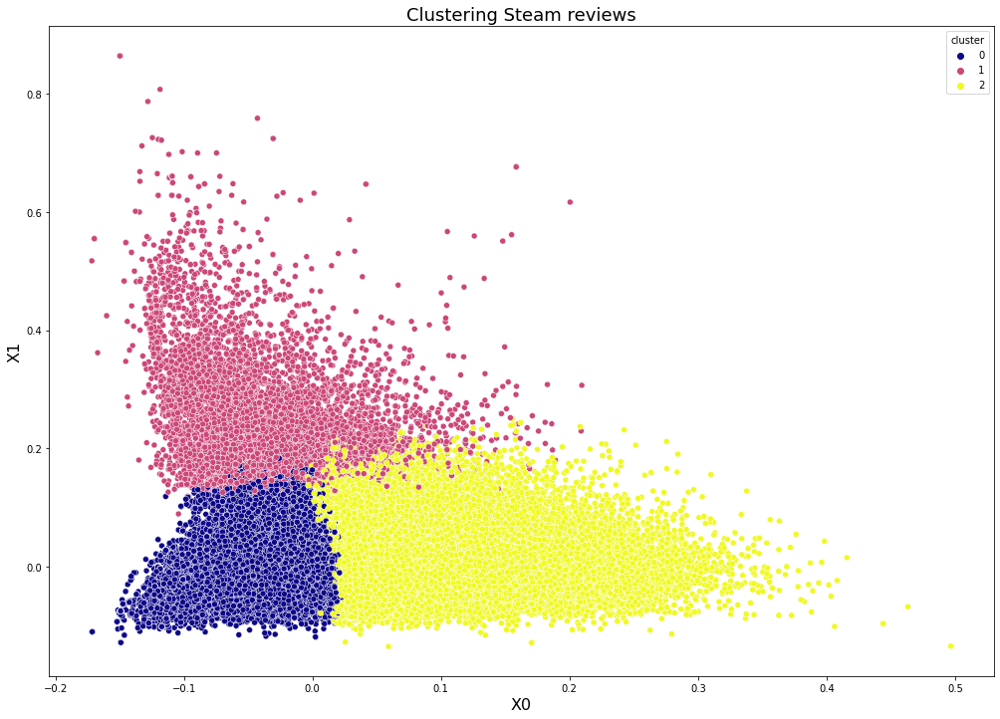

In [61]:
plt.figure(figsize=(17, 12))

plt.title("Clustering Steam reviews", fontdict={"fontsize": 18})

plt.xlabel("X0", fontdict={"fontsize": 16})
plt.ylabel("X1", fontdict={"fontsize": 16})


sns.scatterplot(data=df_reviews_all, x='x0', y='x1', hue='cluster', palette="plasma")

plt.show()

In [ ]:
# df_reviews_all['rev_no_links'] = df_reviews_all['review'].replace(r'http\S+', '', regex=True).replace(r'www\S+', '', regex=True)

In [ ]:
# X_no_link = tfidf_vectorizer.fit_transform(df_reviews_all['rev_no_links'])

In [ ]:
# Sum_of_squared_distances = []
# clusters = range(2,10)

# for k in clusters:
#     km = KMeans(n_clusters=k, max_iter=200, n_init=10)
#     km = km.fit(X_no_link)
#     Sum_of_squared_distances.append(km.inertia_)
    
# plt.plot(clusters, Sum_of_squared_distances, 'bx-')
# plt.xlabel('clusters')
# plt.ylabel('Sum_of_squared_distances')
# plt.title('Optimal clusters')
# plt.show()

In [ ]:
# true_k = 3
# model = KMeans(n_clusters=true_k, init='k-means++', max_iter=200, n_init=10)
# model.fit(X_no_link)
# labels=model.labels_

In [ ]:
# get_top_keywords(10, X_no_link, labels)